In [14]:
import pandas as pd
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt
import os
import random
from PIL import Image
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img
# ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [15]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1


In [16]:
import os
import kagglehub

# Download the Apple Plant dataset
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print("Path to dataset files:", path)

# Define dataset directories for training and testing
dataset_dir = os.path.join(path, "Apple-PlantDoc-Dataset")  # Adjust if necessary
train_dir = os.path.join(dataset_dir, "train")
test_dir = os.path.join(dataset_dir, "test")

# Define class folders
class_dirs = ['Apple Scab Leaf', 'Apple leaf', 'Apple rust leaf']

# Function to count images in each class
def count_images(base_dir, dataset_type):
    print(f"\n{dataset_type} Dataset Overview:")
    print("=" * 30)
    total_images = 0
    
    for class_dir in class_dirs:
        class_path = os.path.join(base_dir, class_dir)
        num_images = len(os.listdir(class_path)) if os.path.exists(class_path) else 0
        print(f"Class: {class_dir}, Number of Images: {num_images}")
        total_images += num_images
    
    print(f"Total Number of Images in {dataset_type} Dataset: {total_images}")

# Count images in training and testing sets
count_images(train_dir, "Training")
count_images(test_dir, "Testing")


Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1

Training Dataset Overview:
Class: Apple Scab Leaf, Number of Images: 77
Class: Apple leaf, Number of Images: 82
Class: Apple rust leaf, Number of Images: 79
Total Number of Images in Training Dataset: 238

Testing Dataset Overview:
Class: Apple Scab Leaf, Number of Images: 10
Class: Apple leaf, Number of Images: 9
Class: Apple rust leaf, Number of Images: 10
Total Number of Images in Testing Dataset: 29


Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1


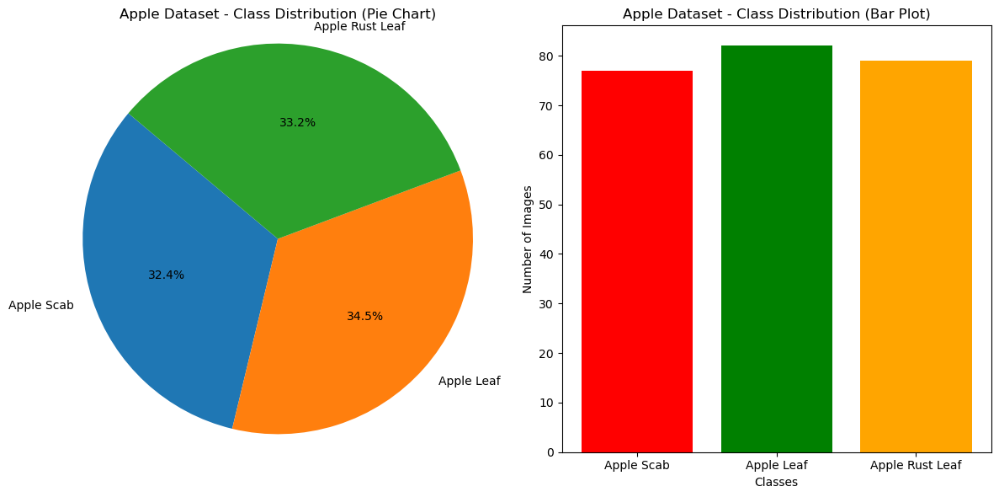

In [17]:
import os
import matplotlib.pyplot as plt
import kagglehub

# Download the Apple Plant dataset
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print("Path to dataset files:", path)

# Define the dataset directory (Adjust if necessary)
dataset_dir = os.path.join(path, "Apple-PlantDoc-Dataset")
train_dir = os.path.join(dataset_dir, "train")  # Only using the training dataset

# Define class folders and labels
class_dirs = ['Apple Scab Leaf', 'Apple leaf', 'Apple rust leaf']
class_labels = ['Apple Scab', 'Apple Leaf', 'Apple Rust Leaf']

# Calculate the number of images in each class
class_counts = []
for class_dir in class_dirs:
    class_path = os.path.join(train_dir, class_dir)
    num_images = len(os.listdir(class_path)) if os.path.exists(class_path) else 0
    class_counts.append(num_images)

# Calculate percentages for the pie chart
total_images = sum(class_counts)
percentages = [(count / total_images) * 100 if total_images > 0 else 0 for count in class_counts]

# Create figure and subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Pie chart
ax1.pie(percentages, labels=class_labels, autopct='%1.1f%%', startangle=140)
ax1.set_title('Apple Dataset - Class Distribution (Pie Chart)')
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Stacked bar plot
ax2.bar(class_labels, class_counts, color=['red', 'green', 'orange'])
ax2.set_title('Apple Dataset - Class Distribution (Bar Plot)')
ax2.set_xlabel('Classes')
ax2.set_ylabel('Number of Images')

# Adjust layout
plt.tight_layout()

# Show plots
plt.show()


Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1


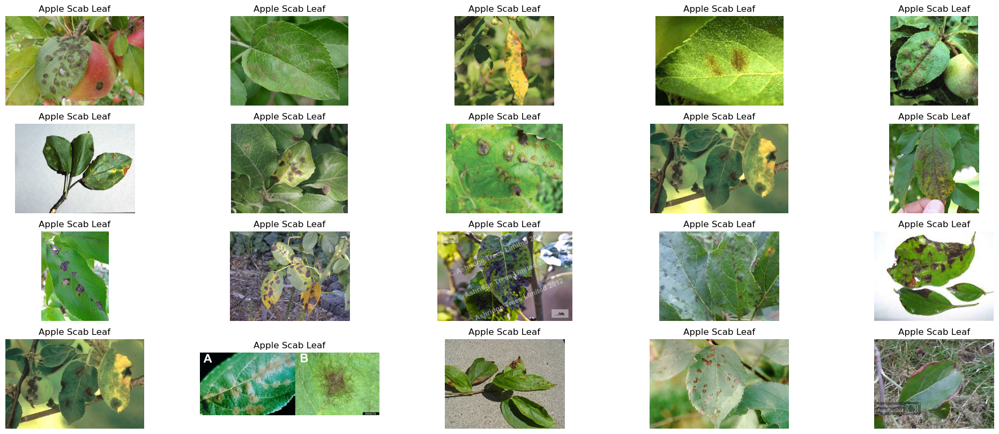

In [4]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import kagglehub

# Download the Apple Plant dataset
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print("Path to dataset files:", path)

# Define dataset directory and class folder
dataset_dir = os.path.join(path, "Apple-PlantDoc-Dataset")
train_dir = os.path.join(dataset_dir, "train")  # Using train set

# Choose a class (change if needed)
class_dir = 'Apple Scab Leaf'  # Change to 'Apple leaf' or 'Apple rust leaf' as needed
class_path = os.path.join(train_dir, class_dir)

# Get the first 20 image filenames
image_files = os.listdir(class_path)[:20]

# Plot the images
plt.figure(figsize=(25, 10))  # Set figure size
for i, image_file in enumerate(image_files):
    img_path = os.path.join(class_path, image_file)
    img = Image.open(img_path)
    
    plt.subplot(4, 5, i + 1)  # 4 rows, 5 columns for 20 images
    plt.imshow(img)
    plt.title(class_dir)
    plt.axis('off')

plt.show()


Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1


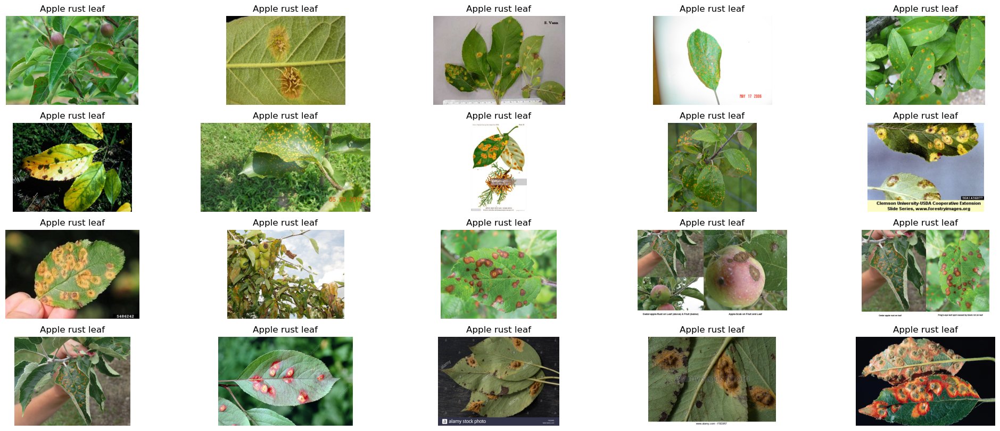

In [5]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import kagglehub

# Download the Apple dataset
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print("Path to dataset files:", path)

# Define dataset directory and class folder
dataset_dir = os.path.join(path, "Apple-PlantDoc-Dataset")
train_dir = os.path.join(dataset_dir, "train")  # Using training data

# Choose a class (change as needed)
class_dir = 'Apple rust leaf'  # Change to 'Apple Scab Leaf' or 'Apple leaf' if needed
class_path = os.path.join(train_dir, class_dir)

# Get the first 20 image filenames
image_files = os.listdir(class_path)[:20]

# Plot the images
plt.figure(figsize=(25, 10))  # Set figure size
for i, image_file in enumerate(image_files):
    img_path = os.path.join(class_path, image_file)
    img = Image.open(img_path)
    
    plt.subplot(4, 5, i + 1)  # 4 rows, 5 columns for 20 images
    plt.imshow(img)
    plt.title(class_dir)
    plt.axis('off')

plt.show()


Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1


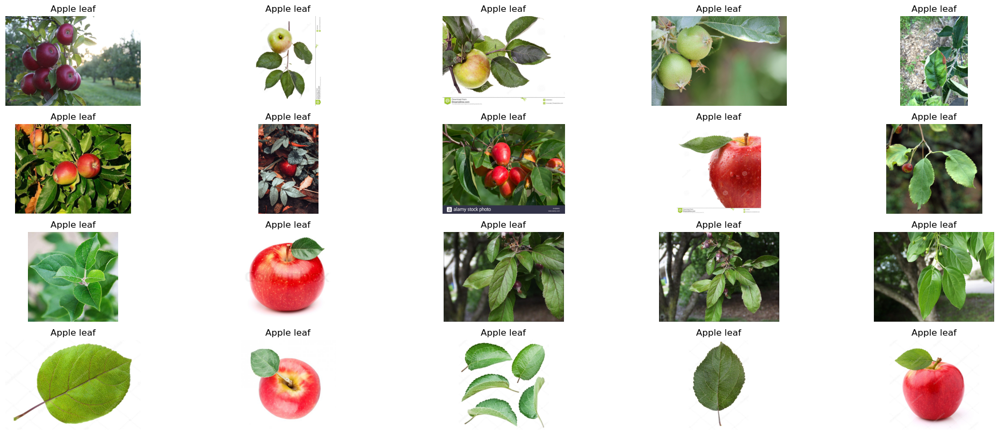

In [6]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import kagglehub

# Download the Apple dataset
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print("Path to dataset files:", path)

# Define dataset directory and class folder
dataset_dir = os.path.join(path, "Apple-PlantDoc-Dataset")
train_dir = os.path.join(dataset_dir, "train")  # Using training dataset

# Choose the class for healthy apple leaves
class_dir = 'Apple leaf'  # Healthy apple leaves
class_path = os.path.join(train_dir, class_dir)

# Get the first 20 image filenames
image_files = os.listdir(class_path)[:20]

# Plot the images
plt.figure(figsize=(25, 10))  # Set figure size
for i, image_file in enumerate(image_files):
    img_path = os.path.join(class_path, image_file)
    img = Image.open(img_path)
    
    plt.subplot(4, 5, i + 1)  # 4 rows, 5 columns for 20 images
    plt.imshow(img)
    plt.title(class_dir)
    plt.axis('off')

plt.show()


Dataset stored at: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1


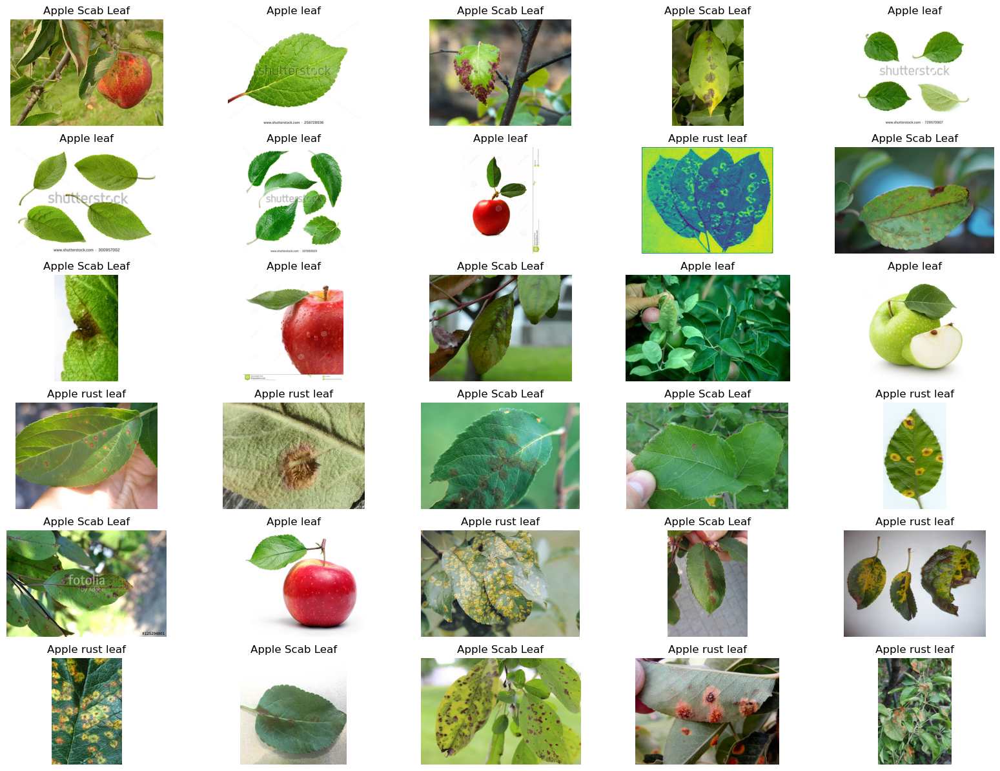

In [8]:
import os
import random
import glob
import matplotlib.pyplot as plt
from PIL import Image
import kagglehub

# Retrieve dataset location
data_path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print("Dataset stored at:", data_path)

# Define dataset folder and target categories
data_folder = os.path.join(data_path, "Apple-PlantDoc-Dataset", "train")  # Using training dataset
categories = ['Apple Scab Leaf', 'Apple leaf', 'Apple rust leaf']  # Apple classes

# Collect image paths from all categories
image_paths = [img for category in categories for img in glob.glob(os.path.join(data_folder, category, "*.jpg"))]

# Randomly choose 30 images for display
selected_images = random.sample(image_paths, min(30, len(image_paths)))

# Display images in a grid layout
plt.figure(figsize=(20, 15))  # Define figure size
for idx, img_path in enumerate(selected_images):
    img = Image.open(img_path)
    plt.subplot(6, 5, idx + 1)  # 6 rows, 5 columns
    plt.imshow(img)
    plt.title(os.path.basename(os.path.dirname(img_path)))  # Display category name
    plt.axis('off')

plt.show()


In [4]:
#eff+lstm
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, LSTM, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications import EfficientNetB3
import kagglehub

# Download dataset from Kaggle Hub
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print(" Path to dataset files:", path)

# Dataset and class names
dataset_dir = os.path.join(path, "Apple-PlantDoc-Dataset", "train")
class_dirs = ['Apple Scab Leaf', 'Apple leaf', 'Apple rust leaf']

# Image Data Generators for training and validation
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    validation_split=0.2,
    horizontal_flip=True,
    zoom_range=0.3,
    shear_range=0.3,
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    validation_split=0.2
)

# Load training and validation data
train_generator = train_datagen.flow_from_directory(
    dataset_dir,
    target_size=(300, 300),
    batch_size=16,
    class_mode='categorical',
    subset='training',
    classes=class_dirs,
    shuffle=True
)

validation_generator = val_datagen.flow_from_directory(
    dataset_dir,
    target_size=(300, 300),
    batch_size=16,
    class_mode='categorical',
    subset='validation',
    classes=class_dirs,
    shuffle=False
)

# Compute class weights to handle imbalance
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights_dict = dict(enumerate(class_weights))
print(" Class Weights:", class_weights_dict)

# Build the model using EfficientNetB3 + LSTM
base_model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(300, 300, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Reshape((1, -1))(x)  # Sequence input for LSTM
x = LSTM(256, return_sequences=False)(x)
x = Dropout(0.5)(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(len(class_dirs), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Define callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

checkpoint = ModelCheckpoint(
    'best_apple_lstm_model.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# Train the model
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, checkpoint, reduce_lr],
    verbose=1
)




 Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1
Found 192 images belonging to 3 classes.
Found 46 images belonging to 3 classes.
 Class Weights: {0: 1.032258064516129, 1: 0.9696969696969697, 2: 1.0}
Epoch 1/50


C:\Users\Sristi\anaconda3\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 853ms/step - accuracy: 0.4424 - loss: 1.0850
Epoch 1: val_loss improved from inf to 1.07033, saving model to best_apple_lstm_model.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.4396 - loss: 1.0851 - val_accuracy: 0.5217 - val_loss: 1.0703 - learning_rate: 1.0000e-04
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 954ms/step - accuracy: 0.4867 - loss: 1.0459
Epoch 2: val_loss improved from 1.07033 to 1.04710, saving model to best_apple_lstm_model.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.4885 - loss: 1.0450 - val_accuracy: 0.6304 - val_loss: 1.0471 - learning_rate: 1.0000e-04
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 874ms/step - accuracy: 0.6072 - loss: 0.9870
Epoch 3: val_loss improved from 1.04710 to 1.02044, saving model to best_apple_lstm_model.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - accuracy: 0.6069 - loss: 0.9867 - val_accuracy: 0.6522 - val_loss: 1.0204 - learning_rate: 1.0000e-04
Epoch 4/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s

In [5]:
best_val_acc = max(history.history['val_accuracy'])
print(f"\n Best Validation Accuracy Achieved: {best_val_acc:.4f}")



🌟 Best Validation Accuracy Achieved: 0.8478


In [19]:
#RESNET+LSTM
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, LSTM, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications import ResNet50
import kagglehub

# Step 1: Download and set dataset path
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print(" Path to dataset files:", path)

dataset_dir = os.path.join(path, "Apple-PlantDoc-Dataset", "train")
class_dirs = ['Apple Scab Leaf', 'Apple leaf', 'Apple rust leaf']

# Step 2: Image data generators with preprocessing
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
    validation_split=0.2,
    horizontal_flip=True,
    zoom_range=0.3,
    shear_range=0.3,
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
    validation_split=0.2
)

# Step 3: Load train and validation data
train_generator = train_datagen.flow_from_directory(
    dataset_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='training',
    classes=class_dirs,
    shuffle=True
)

validation_generator = val_datagen.flow_from_directory(
    dataset_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='validation',
    classes=class_dirs,
    shuffle=False
)

# Step 4: Class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights_dict = dict(enumerate(class_weights))
print(" Class Weights:", class_weights_dict)

# Step 5: Build ResNet50 + LSTM model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Reshape((1, -1))(x)  # Makes it LSTM-compatible
x = LSTM(256, return_sequences=False)(x)
x = Dropout(0.5)(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(len(class_dirs), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Step 6: Freeze ResNet layers
for layer in base_model.layers:
    layer.trainable = False

# Step 7: Compile model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Step 8: Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)
checkpoint = ModelCheckpoint('best_resnet_lstm_apple.keras', monitor='val_loss', save_best_only=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)

# Step 9: Train model
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, checkpoint, reduce_lr],
    verbose=1
)

 Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1
Found 192 images belonging to 3 classes.
Found 46 images belonging to 3 classes.
 Class Weights: {0: 1.032258064516129, 1: 0.9696969696969697, 2: 1.0}
Epoch 1/50


C:\Users\Sristi\anaconda3\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 835ms/step - accuracy: 0.4306 - loss: 1.0749
Epoch 1: val_loss improved from inf to 1.06528, saving model to best_resnet_lstm_apple.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.4336 - loss: 1.0744 - val_accuracy: 0.3696 - val_loss: 1.0653 - learning_rate: 1.0000e-04
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 898ms/step - accuracy: 0.5184 - loss: 0.9942
Epoch 2: val_loss improved from 1.06528 to 1.02208, saving model to best_resnet_lstm_apple.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.5182 - loss: 0.9938 - val_accuracy: 0.4348 - val_loss: 1.0221 - learning_rate: 1.0000e-04
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 779ms/step - accuracy: 0.6704 - loss: 0.8741
Epoch 3: val_loss improved from 1.02208 to 0.97934, saving model to best_resnet_lstm_apple.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.6669 - loss: 0.8740 - val_accuracy: 0.4565 - val_loss: 0.9793 - learning_rate: 1.0000e-04
Epoch 4/50
12/12 ━━━━━━━━━━━━━━━━━━━━

In [25]:
best_val_acc = max(history.history['val_accuracy'])
print(f"\nFinal Validation Accuracy : {best_val_acc:.4f}")


Final Validation Accuracy : 0.7609


In [7]:
#VGG+LSTM
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, LSTM, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications import VGG16
import kagglehub

# Step 1: Download and set dataset path
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print(" Path to dataset files:", path)

dataset_dir = os.path.join(path, "Apple-PlantDoc-Dataset", "train")
class_dirs = ['Apple Scab Leaf', 'Apple leaf', 'Apple rust leaf']

# Step 2: Image data generators
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg16.preprocess_input,
    validation_split=0.2,
    horizontal_flip=True,
    zoom_range=0.3,
    shear_range=0.3,
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg16.preprocess_input,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    dataset_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='training',
    classes=class_dirs,
    shuffle=True
)

validation_generator = val_datagen.flow_from_directory(
    dataset_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='validation',
    classes=class_dirs,
    shuffle=False
)

# Step 3: Class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights_dict = dict(enumerate(class_weights))
print(" Class Weights:", class_weights_dict)

# Step 4: Build VGG16 + LSTM model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Reshape((1, -1))(x)  # Reshape to (1, features) for LSTM
x = LSTM(256, return_sequences=False)(x)
x = Dropout(0.5)(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(len(class_dirs), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Step 5: Freeze VGG16 layers
for layer in base_model.layers:
    layer.trainable = False

# Step 6: Compile model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Step 7: Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)
checkpoint = ModelCheckpoint('best_vgg16_lstm_apple.keras', monitor='val_loss', save_best_only=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)

# Step 8: Train the model
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, checkpoint, reduce_lr],
    verbose=1
)


 Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1
Found 192 images belonging to 3 classes.
Found 46 images belonging to 3 classes.
 Class Weights: {0: 1.032258064516129, 1: 0.9696969696969697, 2: 1.0}
Epoch 1/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2860 - loss: 1.1573
Epoch 1: val_loss improved from inf to 1.10069, saving model to best_vgg16_lstm_apple.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 38s 3s/step - accuracy: 0.2888 - loss: 1.1547 - val_accuracy: 0.3261 - val_loss: 1.1007 - learning_rate: 1.0000e-04
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4550 - loss: 1.0575
Epoch 2: val_loss improved from 1.10069 to 1.06032, saving model to best_vgg16_lstm_apple.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.4568 - loss: 1.0564 - val_accuracy: 0.3913 - val_loss: 1.0603 - learning_rate: 1.0000e-04
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5372 - loss: 1.0052
Epoch 3: val

In [4]:
# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(validation_generator)

# Print the final accuracy score
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.8210 - loss: 0.5559
Validation Accuracy: 78.26%


In [9]:
#TRYING AGAIN EFFICIENT NET
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, LSTM, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications import MobileNetV2
import kagglehub

# Step 1: Download dataset
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print(" Path to dataset files:", path)

# Step 2: Define dataset directory and class labels
dataset_dir = os.path.join(path, "Apple-PlantDoc-Dataset", "train")
class_dirs = ['Apple Scab Leaf', 'Apple leaf', 'Apple rust leaf']

# Step 3: Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
    validation_split=0.2,
    horizontal_flip=True,
    zoom_range=0.3,
    shear_range=0.3,
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    dataset_dir,
    target_size=(224, 224),  # MobileNetV2 input size
    batch_size=16,
    class_mode='categorical',
    subset='training',
    classes=class_dirs,
    shuffle=True
)

validation_generator = val_datagen.flow_from_directory(
    dataset_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='validation',
    classes=class_dirs,
    shuffle=False
)

# Step 4: Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights_dict = dict(enumerate(class_weights))
print(" Class Weights:", class_weights_dict)

# Step 5: Build model using MobileNetV2 + LSTM
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Reshape((1, -1))(x)  # Reshape for LSTM
x = LSTM(256, return_sequences=False)(x)
x = Dropout(0.5)(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(len(class_dirs), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Step 6: Freeze MobileNetV2 base layers
for layer in base_model.layers:
    layer.trainable = False

# Step 7: Compile model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Step 8: Define callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

checkpoint = ModelCheckpoint(
    'best_mobilenetv2_lstm_model.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# Step 9: Train the model
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, checkpoint, reduce_lr],
    verbose=1
)


 Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1
Found 192 images belonging to 3 classes.
Found 46 images belonging to 3 classes.
 Class Weights: {0: 1.032258064516129, 1: 0.9696969696969697, 2: 1.0}
Epoch 1/50


C:\Users\Sristi\anaconda3\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - accuracy: 0.3843 - loss: 1.1153
Epoch 1: val_loss improved from inf to 1.06774, saving model to best_mobilenetv2_lstm_model.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 13s 497ms/step - accuracy: 0.3860 - loss: 1.1137 - val_accuracy: 0.5870 - val_loss: 1.0677 - learning_rate: 1.0000e-04
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.4212 - loss: 1.0697
Epoch 2: val_loss improved from 1.06774 to 1.04089, saving model to best_mobilenetv2_lstm_model.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 379ms/step - accuracy: 0.4277 - loss: 1.0677 - val_accuracy: 0.6304 - val_loss: 1.0409 - learning_rate: 1.0000e-04
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.6138 - loss: 0.9899
Epoch 3: val_loss improved from 1.04089 to 1.00741, saving model to best_mobilenetv2_lstm_model.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 385ms/step - accuracy: 0.6171 - loss: 0.9878 - val_accuracy: 0.6522 - val_loss: 1.0074 - learning_rate: 1.0000e-04
Epoch 4/50
12/1

In [12]:
best_val_acc = max(history.history['val_accuracy'])
rounded_acc = round(best_val_acc * 100, 2)
print(f"\nFinal Validation Accuracy : {rounded_acc}%")



Final Validation Accuracy : 84.78%


 Path to dataset files: C:\Users\Sristi\.cache\kagglehub\datasets\abdulhasibuddin\appleplantdocdataset\versions\1
Found 192 images belonging to 3 classes.
Found 46 images belonging to 3 classes.
 Class Weights: {0: 1.032258064516129, 1: 0.9696969696969697, 2: 1.0}
Epoch 1/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.3817 - loss: 1.0927
Epoch 1: val_loss improved from inf to 1.08601, saving model to best_mobilenetv2_lstm_model.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 13s 519ms/step - accuracy: 0.3832 - loss: 1.0919 - val_accuracy: 0.3696 - val_loss: 1.0860 - learning_rate: 1.0000e-04
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step - accuracy: 0.4375 - loss: 1.0649
Epoch 2: val_loss improved from 1.08601 to 1.05807, saving model to best_mobilenetv2_lstm_model.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 412ms/step - accuracy: 0.4427 - loss: 1.0629 - val_accuracy: 0.5000 - val_loss: 1.0581 - learning_rate: 1.0000e-04
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.5632 -

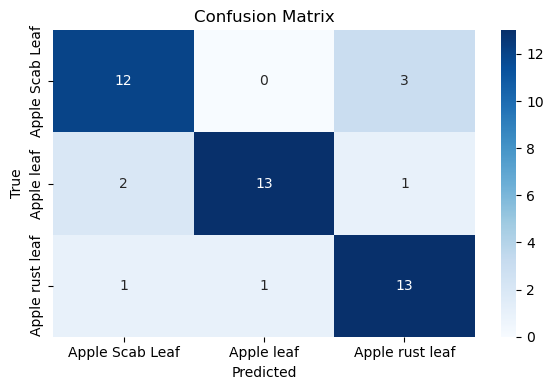


Total misclassified samples: 8


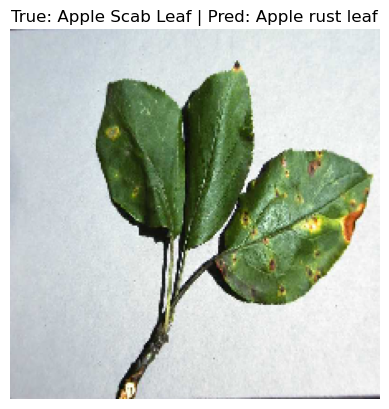

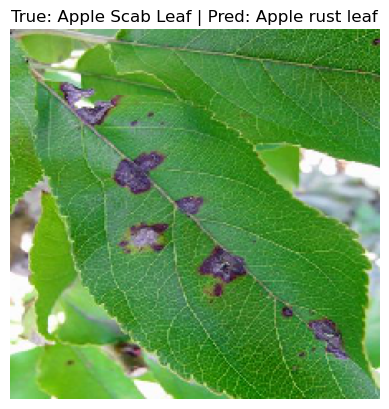

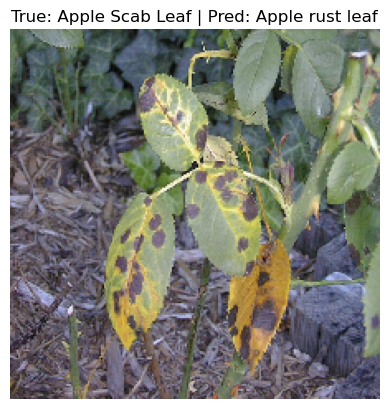

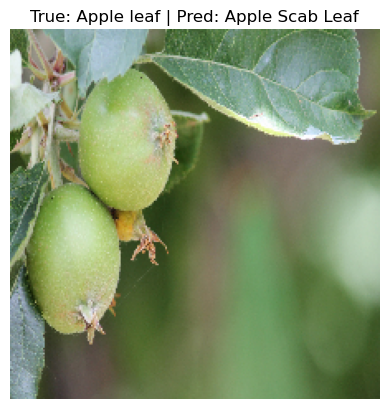

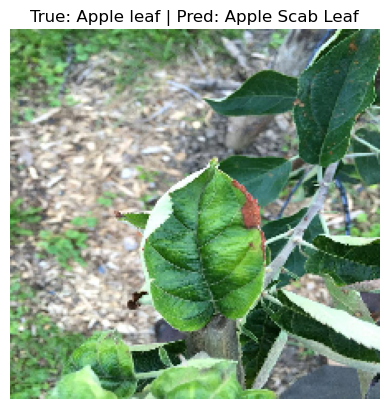

In [20]:
#mobilenet+lstm
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, LSTM, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications import MobileNetV2
import kagglehub

# Step 1: Download dataset
path = kagglehub.dataset_download("abdulhasibuddin/appleplantdocdataset")
print(" Path to dataset files:", path)

# Step 2: Define dataset directory and class labels
dataset_dir = os.path.join(path, "Apple-PlantDoc-Dataset", "train")
class_dirs = ['Apple Scab Leaf', 'Apple leaf', 'Apple rust leaf']

#step2.5

# Step 3: Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
    validation_split=0.2,
    horizontal_flip=True,
    zoom_range=0.3,
    shear_range=0.3,
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    dataset_dir,
    target_size=(224, 224),  # MobileNetV2 input size
    batch_size=16,
    class_mode='categorical',
    subset='training',
    classes=class_dirs,
    shuffle=True
)

validation_generator = val_datagen.flow_from_directory(
    dataset_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='validation',
    classes=class_dirs,
    shuffle=False
)

# Step 4: Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights_dict = dict(enumerate(class_weights))
print(" Class Weights:", class_weights_dict)

# Step 5: Build model using MobileNetV2 + LSTM
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Reshape((1, -1))(x)  # Reshape for LSTM
x = LSTM(256, return_sequences=False)(x)
x = Dropout(0.5)(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(len(class_dirs), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Step 6: Freeze MobileNetV2 base layers
for layer in base_model.layers:
    layer.trainable = False

# Step 7: Compile model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Step 8: Define callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

checkpoint = ModelCheckpoint(
    'best_mobilenetv2_lstm_model.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# Step 9: Train the model
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, checkpoint, reduce_lr],
    verbose=1
)

from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Step 10: Predict on validation data
val_steps = validation_generator.samples // validation_generator.batch_size + 1
y_pred_probs = model.predict(validation_generator, steps=val_steps)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = validation_generator.classes
class_labels = list(validation_generator.class_indices.keys())

# Step 11: Print classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))

# Step 12: Show confusion matrix
print("\nConfusion Matrix:")
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

# Step 13: Check which images were misclassified (optional)
import numpy as np
import matplotlib.pyplot as plt

misclassified_indices = np.where(y_pred != y_true)[0]
print(f"\nTotal misclassified samples: {len(misclassified_indices)}")

# Show a few misclassified images
for i in misclassified_indices[:5]:  # Show first 5
    img_path = validation_generator.filepaths[i]
    img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"True: {class_labels[y_true[i]]} | Pred: {class_labels[y_pred[i]]}")
    plt.show()

